## **NETWORK INTRUSION DETECTION**

**Necessary Module Imports**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import mutual_info_classif
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neural_network import MLPClassifier

**Load Dataset**

In [2]:
nids_original_dataframe = pd.read_csv('nids_data.csv')

#### **Perform Exploratory Data Analysis**

In [3]:
print(nids_original_dataframe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25192 entries, 0 to 25191
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   duration                     25192 non-null  int64  
 1   protocol_type                25192 non-null  object 
 2   service                      25192 non-null  object 
 3   flag                         25192 non-null  object 
 4   src_bytes                    25192 non-null  int64  
 5   dst_bytes                    25192 non-null  int64  
 6   land                         25192 non-null  int64  
 7   wrong_fragment               25192 non-null  int64  
 8   urgent                       25192 non-null  int64  
 9   hot                          25192 non-null  int64  
 10  num_failed_logins            25192 non-null  int64  
 11  logged_in                    25192 non-null  int64  
 12  num_compromised              25192 non-null  int64  
 13  root_shell      

In [4]:
nids_original_dataframe.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
count,25192.000000,2.519200e+04,2.519200e+04,25192.000000,25192.000000,25192.00000,25192.000000,25192.000000,25192.000000,25192.000000,...,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000
mean,305.054104,2.433063e+04,3.491847e+03,0.000079,0.023738,0.00004,0.198039,0.001191,0.394768,0.227850,...,182.532074,115.063036,0.519791,0.082539,0.147453,0.031844,0.285800,0.279846,0.117800,0.118769
std,2686.555640,2.410805e+06,8.883072e+04,0.008910,0.260221,0.00630,2.154202,0.045418,0.488811,10.417352,...,98.993895,110.646850,0.448944,0.187191,0.308367,0.110575,0.445316,0.446075,0.305869,0.317333
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,84.000000,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,255.000000,61.000000,0.510000,0.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,2.790000e+02,5.302500e+02,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,...,255.000000,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000
max,42862.000000,3.817091e+08,5.151385e+06,1.000000,3.000000,1.00000,77.000000,4.000000,1.000000,884.000000,...,255.000000,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
nids_original_dataframe.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,class
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal
1,0,udp,other,SF,146,0,0,0,0,0,...,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal
2,0,tcp,private,S0,0,0,0,0,0,0,...,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,anomaly
3,0,tcp,http,SF,232,8153,0,0,0,0,...,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal
4,0,tcp,http,SF,199,420,0,0,0,0,...,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal


**Check Missing values**

In [6]:
print(nids_original_dataframe.isna().sum())

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

In [7]:
print(nids_original_dataframe['class'].unique())

['normal' 'anomaly']


**Co-relational Heatmap on the original dataset**

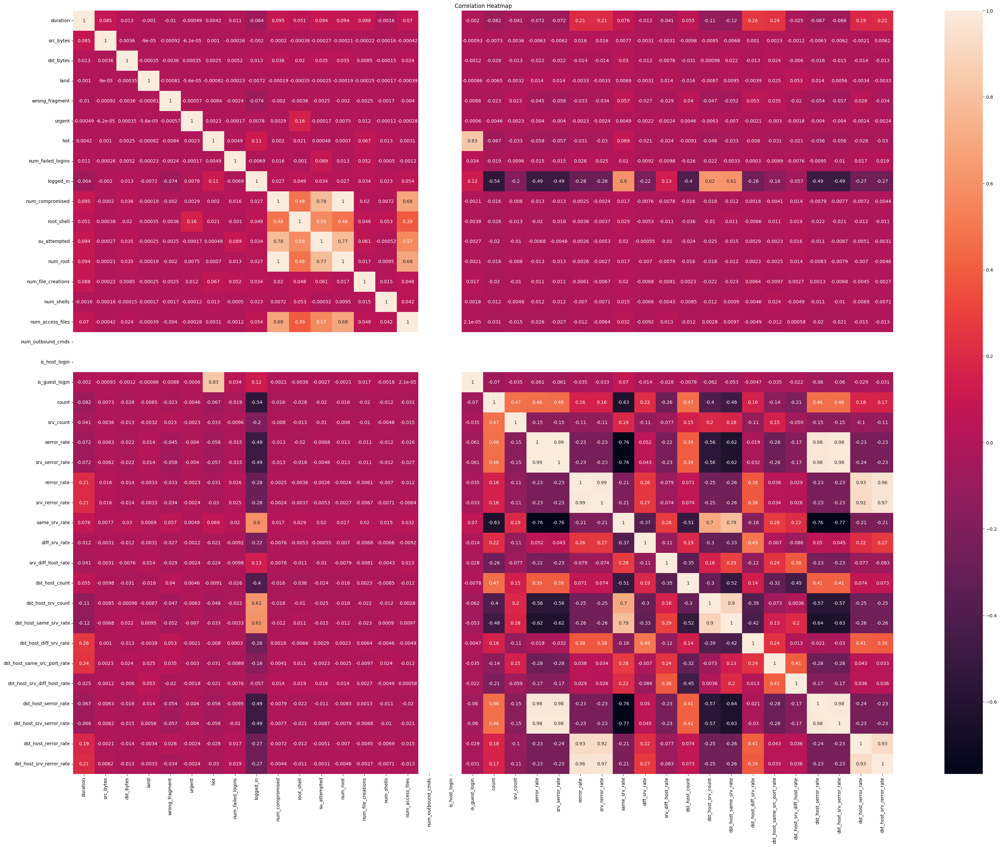

In [8]:
plt.figure(figsize=(40,30))
sns.heatmap(nids_original_dataframe.corr(numeric_only=True),annot=True)
plt.title('Correlation Heatmap')
plt.show()

**Finding the single value features**

In [9]:
single_value_features = []

for col in nids_original_dataframe.columns:
    if len(nids_original_dataframe[col].unique()) == 1:
        single_value_features.append(col)

print("Features with only a single value:")
print(single_value_features)


Features with only a single value:
['num_outbound_cmds', 'is_host_login']


**Drop single value features**
> - Dropped features: `num_outbound_cmds` and `is_host_login`

In [10]:

# Drop the single value features from the DataFrame
nids_original_dataframe = nids_original_dataframe.drop(single_value_features, axis=1)


**Duplicate row check**

In [11]:

import pandas as pd


# Check for duplicate rows
duplicate_rows = nids_original_dataframe.duplicated()

# Count the number of duplicate rows
num_duplicate_rows = duplicate_rows.sum()

if num_duplicate_rows > 0:
    print("The dataset has duplicate rows.")
    print("Number of duplicate rows:", num_duplicate_rows)
else:
    print("The dataset does not have any duplicate rows.")

The dataset does not have any duplicate rows.


**Observing Categorial and Numerical Columns**

In [12]:
categorical_columns = nids_original_dataframe.select_dtypes(include=['object']).columns.tolist()
numerical_columns = nids_original_dataframe.select_dtypes(include=['int64', 'float64']).columns.tolist()

print("Categorical Columns:")
print(categorical_columns)

print("\nNumerical Columns:")
print(numerical_columns)


Categorical Columns:
['protocol_type', 'service', 'flag', 'class']

Numerical Columns:
['duration', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'is_guest_login', 'count', 'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_serror_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate']


In [13]:
for col in categorical_columns:
    print(nids_original_dataframe[col].unique())

['tcp' 'udp' 'icmp']
['ftp_data' 'other' 'private' 'http' 'remote_job' 'name' 'netbios_ns'
 'eco_i' 'mtp' 'telnet' 'finger' 'domain_u' 'supdup' 'uucp_path' 'Z39_50'
 'smtp' 'csnet_ns' 'uucp' 'netbios_dgm' 'urp_i' 'auth' 'domain' 'ftp'
 'bgp' 'ldap' 'ecr_i' 'gopher' 'vmnet' 'systat' 'http_443' 'efs' 'whois'
 'imap4' 'iso_tsap' 'echo' 'klogin' 'link' 'sunrpc' 'login' 'kshell'
 'sql_net' 'time' 'hostnames' 'exec' 'ntp_u' 'discard' 'nntp' 'courier'
 'ctf' 'ssh' 'daytime' 'shell' 'netstat' 'pop_3' 'nnsp' 'IRC' 'pop_2'
 'printer' 'tim_i' 'pm_dump' 'red_i' 'netbios_ssn' 'rje' 'X11' 'urh_i'
 'http_8001']
['SF' 'S0' 'REJ' 'RSTR' 'SH' 'RSTO' 'S1' 'RSTOS0' 'S3' 'S2' 'OTH']
['normal' 'anomaly']


In [14]:

numerical_columns = nids_original_dataframe.select_dtypes(exclude=['object']).columns.tolist()


**Checking unique values from the categorical columns**

In [15]:
for col in categorical_columns:
    print(nids_original_dataframe[col].unique())

['tcp' 'udp' 'icmp']
['ftp_data' 'other' 'private' 'http' 'remote_job' 'name' 'netbios_ns'
 'eco_i' 'mtp' 'telnet' 'finger' 'domain_u' 'supdup' 'uucp_path' 'Z39_50'
 'smtp' 'csnet_ns' 'uucp' 'netbios_dgm' 'urp_i' 'auth' 'domain' 'ftp'
 'bgp' 'ldap' 'ecr_i' 'gopher' 'vmnet' 'systat' 'http_443' 'efs' 'whois'
 'imap4' 'iso_tsap' 'echo' 'klogin' 'link' 'sunrpc' 'login' 'kshell'
 'sql_net' 'time' 'hostnames' 'exec' 'ntp_u' 'discard' 'nntp' 'courier'
 'ctf' 'ssh' 'daytime' 'shell' 'netstat' 'pop_3' 'nnsp' 'IRC' 'pop_2'
 'printer' 'tim_i' 'pm_dump' 'red_i' 'netbios_ssn' 'rje' 'X11' 'urh_i'
 'http_8001']
['SF' 'S0' 'REJ' 'RSTR' 'SH' 'RSTO' 'S1' 'RSTOS0' 'S3' 'S2' 'OTH']
['normal' 'anomaly']


**Performing values occurance/count for each column**

In [16]:
import pandas as pd

# Assuming nids_original_dataframe is your DataFrame containing the data
categorical_col = nids_original_dataframe.select_dtypes(exclude=['number']).columns.tolist()
for col in categorical_col:
    print("Column:", col)
    print(nids_original_dataframe[col].value_counts())

Column: protocol_type
protocol_type
tcp     20526
udp      3011
icmp     1655
Name: count, dtype: int64
Column: service
service
http         8003
private      4351
domain_u     1820
smtp         1449
ftp_data     1396
             ... 
urh_i           4
red_i           3
pm_dump         3
tim_i           2
http_8001       1
Name: count, Length: 66, dtype: int64
Column: flag
flag
SF        14973
S0         7009
REJ        2216
RSTR        497
RSTO        304
S1           88
SH           43
RSTOS0       21
S2           21
S3           15
OTH           5
Name: count, dtype: int64
Column: class
class
normal     13449
anomaly    11743
Name: count, dtype: int64


In [17]:
rows_to_remove_categorical = []
for col in categorical_columns:
    values_to_remove_categorical = nids_original_dataframe[col].value_counts()[nids_original_dataframe[col].value_counts() < 5].index
    rows_to_remove_categorical.extend(nids_original_dataframe[nids_original_dataframe[col].isin(values_to_remove_categorical)].index)


rows_to_remove_categorical = list(set(rows_to_remove_categorical))


nids_original_dataframe = nids_original_dataframe.drop(rows_to_remove_categorical)
nids_original_dataframe = nids_original_dataframe.reset_index(drop=True)
print(nids_original_dataframe.shape)


(25179, 40)


In [18]:
print(nids_original_dataframe.shape)

(25179, 40)


In [19]:
print(nids_original_dataframe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25179 entries, 0 to 25178
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   duration                     25179 non-null  int64  
 1   protocol_type                25179 non-null  object 
 2   service                      25179 non-null  object 
 3   flag                         25179 non-null  object 
 4   src_bytes                    25179 non-null  int64  
 5   dst_bytes                    25179 non-null  int64  
 6   land                         25179 non-null  int64  
 7   wrong_fragment               25179 non-null  int64  
 8   urgent                       25179 non-null  int64  
 9   hot                          25179 non-null  int64  
 10  num_failed_logins            25179 non-null  int64  
 11  logged_in                    25179 non-null  int64  
 12  num_compromised              25179 non-null  int64  
 13  root_shell      

**Checking Class Balance**

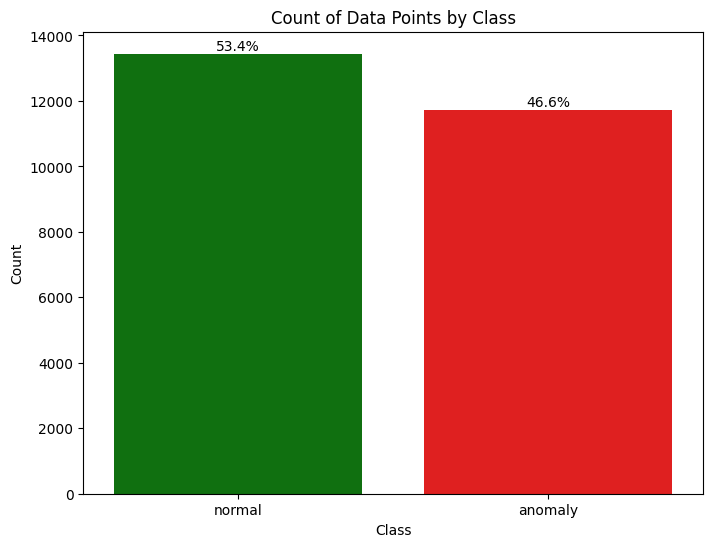

class
normal     13442
anomaly    11737
Name: count, dtype: int64


In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create countplot with color for each class
plt.figure(figsize=(8, 6))
sns.countplot(x='class', hue='class', data=nids_original_dataframe, palette=['green', 'red'], legend=False)
plt.title('Count of Data Points by Class')
plt.xlabel('Class')
plt.ylabel('Count')

# Add percentage annotations
total_points = len(nids_original_dataframe)
for p in plt.gca().patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + 0.1,
             '{:.1f}%'.format((height / total_points) * 100),
             ha='center', va='bottom')

plt.show()
print(nids_original_dataframe['class'].value_counts())

**Label Encoding the target variable `class`**

In [21]:
from sklearn.preprocessing import LabelEncoder

# Assuming nids_original_dataframe is your DataFrame

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable
nids_original_dataframe['class'] = label_encoder.fit_transform(nids_original_dataframe['class'])




**Class count**

In [22]:
print(nids_original_dataframe['class'].value_counts())

class
1    13442
0    11737
Name: count, dtype: int64


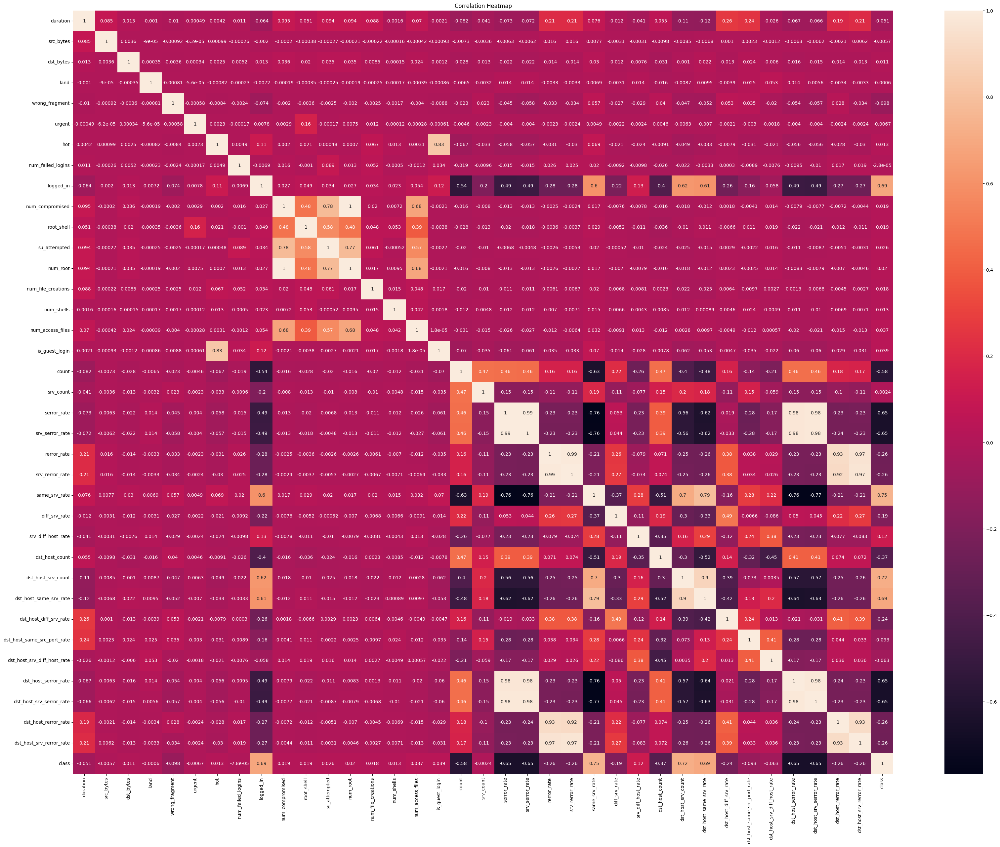

In [24]:
plt.figure(figsize=(40,30))
sns.heatmap(nids_original_dataframe.corr(numeric_only=True),annot=True)
plt.title('Correlation Heatmap')
plt.show()

**Column Sharing same information**: 

>If two columns are highly co-related to each other, and if have same correlation pattern with the rest of the other columns, then those columns can be considered as the same information sharing or likely duplicate columns, as they share the same correlational values across all the features.
Such pair of columns were discovered, and only one of the column which can be better representative of the target feature was selected.

>Example of such pair of columns include include: 
•	`serror_rat`e and  `srv_serror_rate`
•	`rerror_rate` and `srv_rerror_rate`
Hence removing one of the feature among a pair, two reduce computational compelxity.


In [25]:
highly_correlated_features = ['dst_host_serror_rate','dst_host_rerror_rate', 'srv_rerror_rate','srv_serror_rate', 'num_root']
nids_original_dataframe.drop(highly_correlated_features , axis=1, inplace=True)


In [26]:
from sklearn.feature_selection import mutual_info_classif
nids_num = nids_original_dataframe.select_dtypes(include=['number'])
X_val = nids_num.drop(['class'], axis=1)
y_val = nids_original_dataframe['class']
mutual_info = mutual_info_classif(X_val,y_val)
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_val.columns
mutual_info.sort_values(ascending=False)


src_bytes                      0.565816
dst_bytes                      0.434821
diff_srv_rate                  0.353336
same_srv_rate                  0.352691
dst_host_srv_count             0.330281
dst_host_same_srv_rate         0.308676
dst_host_diff_srv_rate         0.288173
logged_in                      0.281127
dst_host_srv_serror_rate       0.276895
serror_rate                    0.273024
count                          0.262919
dst_host_srv_diff_host_rate    0.186655
dst_host_same_src_port_rate    0.137972
dst_host_count                 0.133855
srv_diff_host_rate             0.100039
srv_count                      0.063846
dst_host_srv_rerror_rate       0.060171
rerror_rate                    0.040037
duration                       0.024443
hot                            0.009988
num_shells                     0.007649
num_compromised                0.006177
num_access_files               0.005723
is_guest_login                 0.004484
root_shell                     0.003044


In [27]:
selected_features = mutual_info[mutual_info >0.1]

# Convert the selected features to a list
significant_features = selected_features.index.tolist()
insignicant_features = mutual_info[mutual_info <=0.1]
insignificant_features = insignicant_features.index.tolist()


<Axes: >

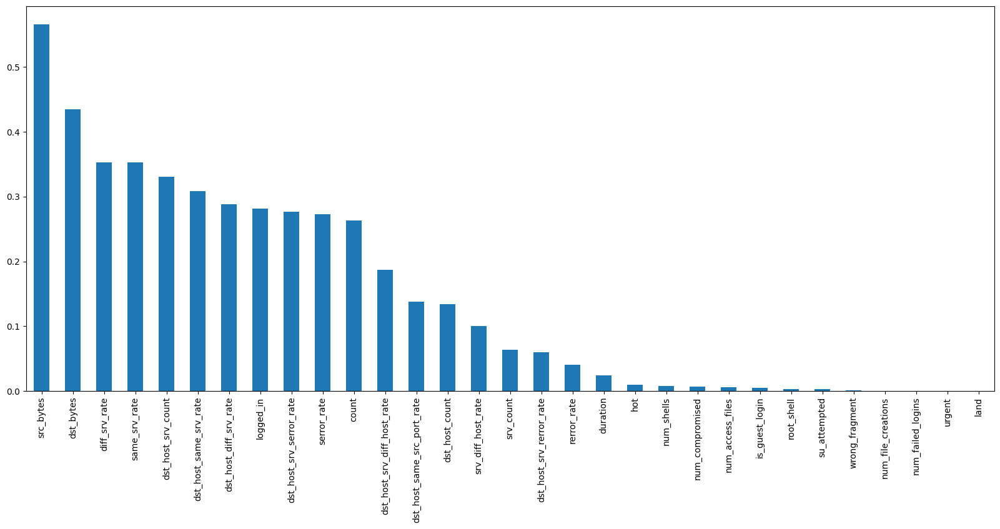

In [28]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20,8))

In [29]:
print(insignificant_features)

['duration', 'land', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'num_compromised', 'root_shell', 'su_attempted', 'num_file_creations', 'num_shells', 'num_access_files', 'is_guest_login', 'srv_count', 'rerror_rate', 'dst_host_srv_rerror_rate']


In [30]:

nids_original_dataframe.drop(insignificant_features , axis=1, inplace=True)

**Correlational Heatmap of fearures**

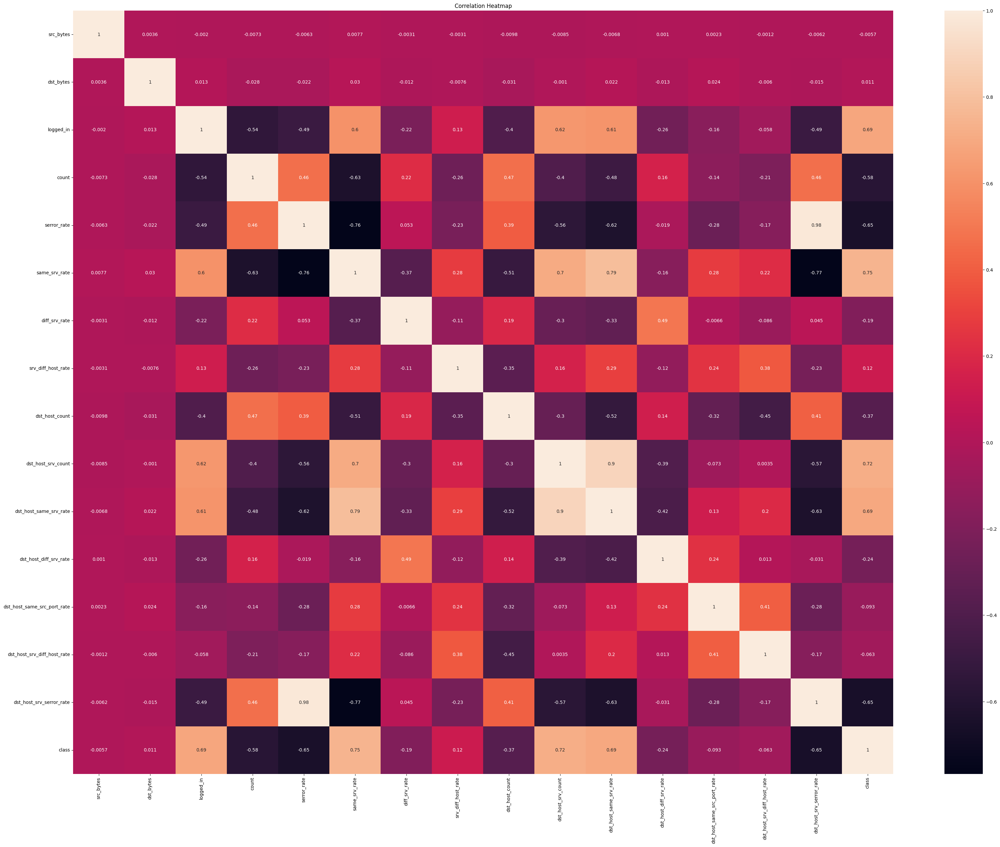

In [31]:
plt.figure(figsize=(40,30))
sns.heatmap(nids_original_dataframe.corr(numeric_only=True),annot=True)
plt.title('Correlation Heatmap')
plt.show()

**Outlier Analysis**

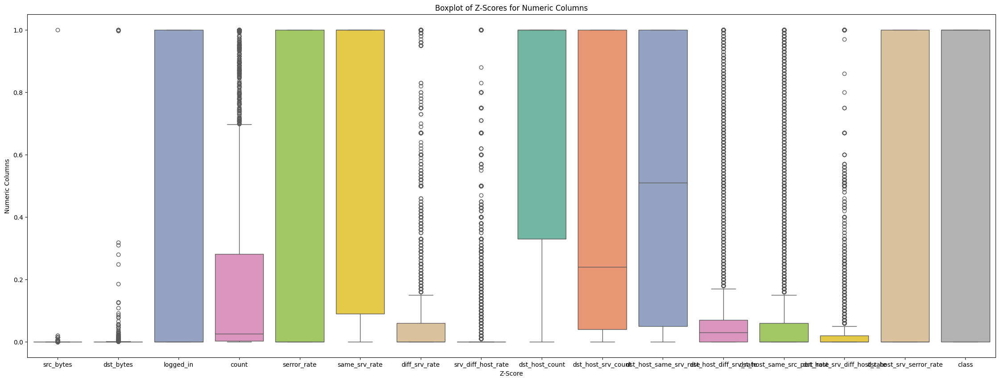

Total data row count => 25179
Outlier row count => 3564


In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
# Calculate z-scores for each numeric column

nids_numeric = nids_original_dataframe.copy()
nids_numeric = nids_numeric.select_dtypes(include=['number'])
z_scores = stats.zscore(nids_numeric)

# Create a DataFrame of z-scores
z_scores_df = pd.DataFrame(z_scores, columns=nids_numeric.columns)




# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler to your data and transform the data
scaled_data = scaler.fit_transform(z_scores_df)

# Create a DataFrame of the scaled data
scaled_data_df = pd.DataFrame(scaled_data, columns=z_scores_df.columns)

# Set up the boxplot figure for scaled data
plt.figure(figsize=(28, 10))

# Draw boxplots for each numeric column
sns.boxplot(data=scaled_data_df, orient='v', palette='Set2')

# Add title and labels
plt.title('Boxplot of Z-Scores for Numeric Columns')
plt.xlabel('Z-Score')
plt.ylabel('Numeric Columns')

# Display the plot
plt.show()

threshold = 3
abs_z_scores = np.abs(z_scores)
# Find rows with any z-score exceeding the threshold
print("Total data row count =>", nids_original_dataframe.shape[0])
outlier_rows = nids_original_dataframe[(abs_z_scores > threshold).any(axis=1)]
print("Outlier row count =>", outlier_rows.shape[0])


In [33]:
print(nids_original_dataframe)

      protocol_type   service  flag  src_bytes  dst_bytes  logged_in  count  \
0               tcp  ftp_data    SF        491          0          0      2   
1               udp     other    SF        146          0          0     13   
2               tcp   private    S0          0          0          0    123   
3               tcp      http    SF        232       8153          1      5   
4               tcp      http    SF        199        420          1     30   
...             ...       ...   ...        ...        ...        ...    ...   
25174           tcp      exec  RSTO          0          0          0    100   
25175           tcp  ftp_data    SF        334          0          1      1   
25176           tcp   private   REJ          0          0          0    105   
25177           tcp      nnsp    S0          0          0          0    129   
25178           tcp    finger    S0          0          0          0     38   

       serror_rate  same_srv_rate  diff_srv_rate  s

In [34]:
numeric_dataframe = nids_original_dataframe.select_dtypes(include=['number'])
print(numeric_dataframe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25179 entries, 0 to 25178
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   src_bytes                    25179 non-null  int64  
 1   dst_bytes                    25179 non-null  int64  
 2   logged_in                    25179 non-null  int64  
 3   count                        25179 non-null  int64  
 4   serror_rate                  25179 non-null  float64
 5   same_srv_rate                25179 non-null  float64
 6   diff_srv_rate                25179 non-null  float64
 7   srv_diff_host_rate           25179 non-null  float64
 8   dst_host_count               25179 non-null  int64  
 9   dst_host_srv_count           25179 non-null  int64  
 10  dst_host_same_srv_rate       25179 non-null  float64
 11  dst_host_diff_srv_rate       25179 non-null  float64
 12  dst_host_same_src_port_rate  25179 non-null  float64
 13  dst_host_srv_dif

In [35]:
significant_features += ['class']
print(significant_features)


['src_bytes', 'dst_bytes', 'logged_in', 'count', 'serror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_srv_serror_rate', 'class']


**Pairplot of featues**

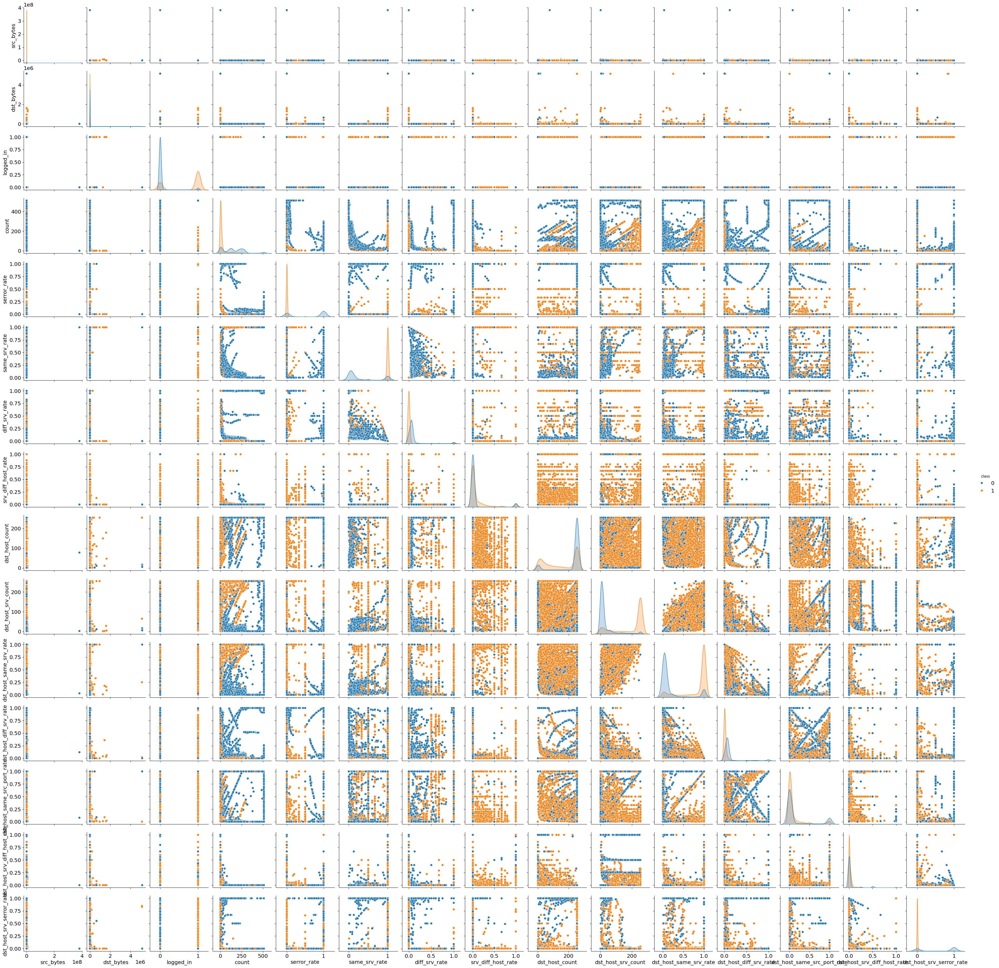

In [101]:
sns.pairplot(nids_original_dataframe[significant_features], hue='class')

**Histogram and data distribution of features**

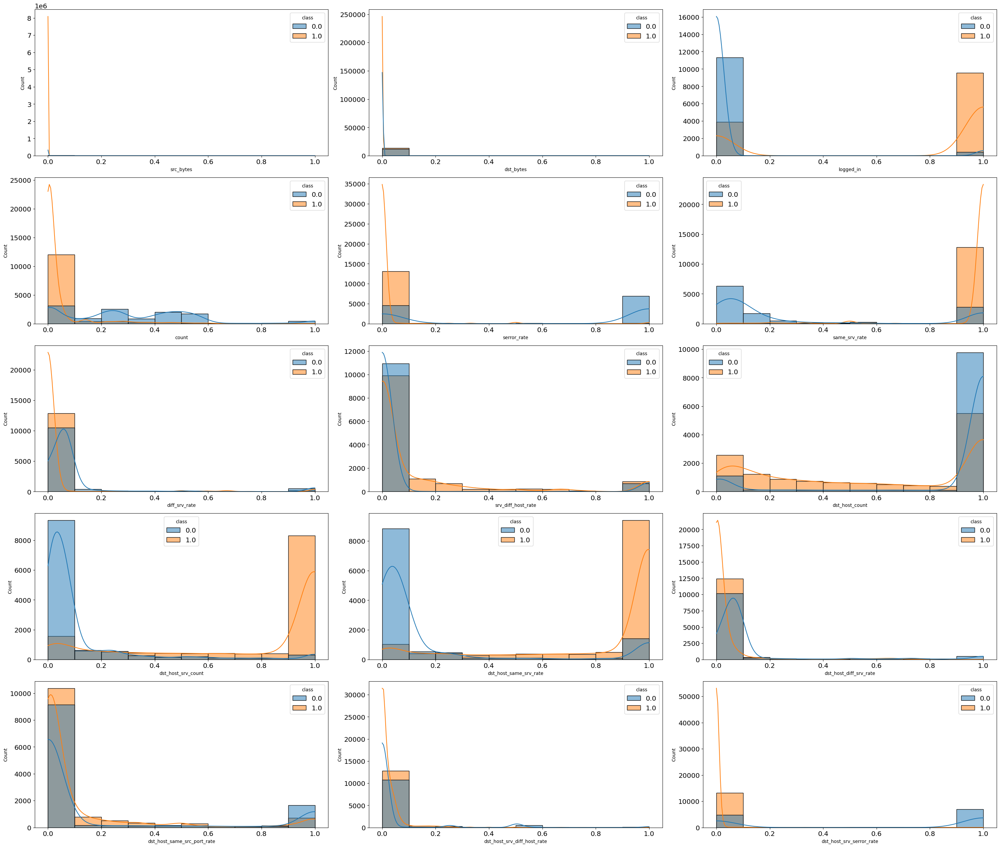

In [100]:
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import seaborn as sns

# Compute min-max normalization
min_vals = nids_original_dataframe[significant_features].min()
max_vals = nids_original_dataframe[significant_features].max()
normalized_data = (nids_original_dataframe[significant_features] - min_vals) / (max_vals - min_vals)

params = {
    'legend.fontsize': 'x-large',
    'figure.figsize': (2, 4),
    'axes.labelsize': 'x-large',
    'axes.titlesize': 'x-large',
    'xtick.labelsize': 'x-large',
    'ytick.labelsize': 'x-large'
}
pylab.rcParams.update(params)

plt.figure(figsize=(30, 30))

num_cols = 3
num_rows = int(normalized_data.shape[1] / num_cols) + 1

for index, col in enumerate(normalized_data.drop('class', axis=1).columns):
    plt.subplot(num_rows, num_cols, index + 1)
    sns.histplot(normalized_data, x=col, hue='class', kde=True, bins=10)

    # Increase x-axis and y-axis title font size
    plt.xlabel(col, fontsize=10)
    plt.ylabel('Count', fontsize=10)

plt.tight_layout()
plt.show()


**Performing Normal distrubition of the features**

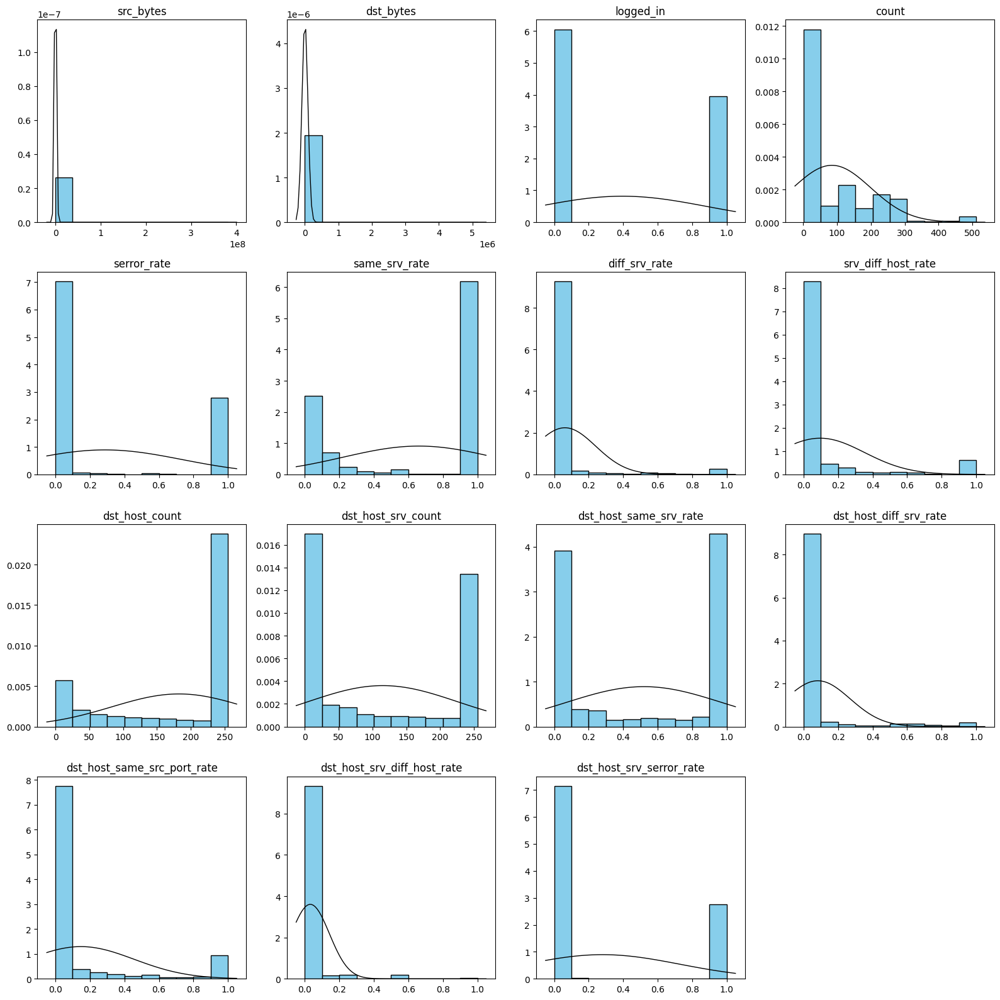

In [97]:
from scipy.stats import norm


# Remove 'class' from the list
significant_features_copy = significant_features.copy()
try:
    
    significant_features_copy.remove('class')
except:
    print("")

significant_feat_df = nids_original_dataframe[significant_features_copy]

num_features = len(significant_feat_df.columns)
num_rows = int(np.ceil(num_features**0.5))
num_cols = int(np.ceil(num_features / num_rows))

# Plot histogram subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 16))

for i, col in enumerate(significant_feat_df.columns):
    ax = axes[i // num_cols, i % num_cols]
    ax.hist(significant_feat_df[col], bins=10, color='skyblue', edgecolor='black', density=True)
    ax.set_title(col)

    # Fit a normal distribution to the data
    mu, std = norm.fit(significant_feat_df[col])
    
    # Plot the normal distribution curve
    xmin, xmax = ax.get_xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    ax.plot(x, p, 'k', linewidth=1)

# Hide any empty subplots
for j in range(num_features, num_rows * num_cols):
    axes.flatten()[j].axis('off')

plt.tight_layout()
plt.show()

**Scatter plot of target class**

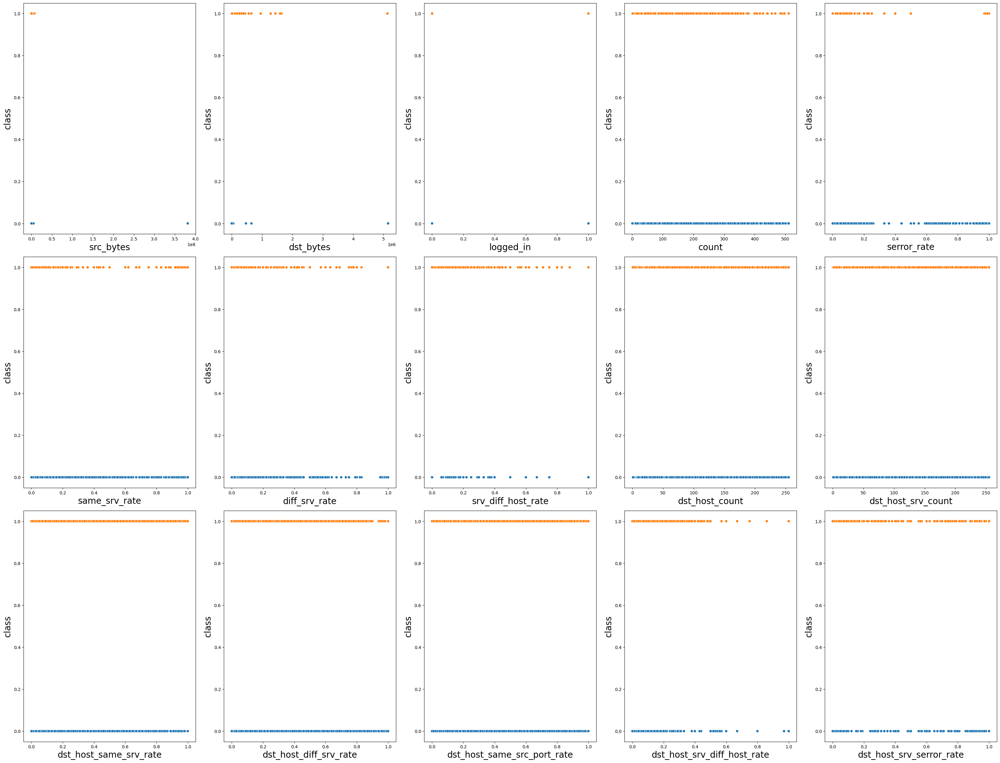

In [98]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(32, 32))

num_cols = 5
num_rows = int(nids_original_dataframe[significant_features].shape[1] / num_cols) + 1

for index, col in enumerate(nids_original_dataframe[significant_features].drop('class', axis=1).columns):
    plt.subplot(num_rows, num_cols, index + 1)
    sns.scatterplot(data=nids_original_dataframe[significant_features], x=col, y='class', hue=nids_original_dataframe['class'], legend=False)

    # Increase x-axis and y-axis title font size
    plt.xlabel(col, fontsize=20)
    plt.ylabel('class', fontsize=20)

plt.tight_layout()
plt.show()


**Box plot of features data point**

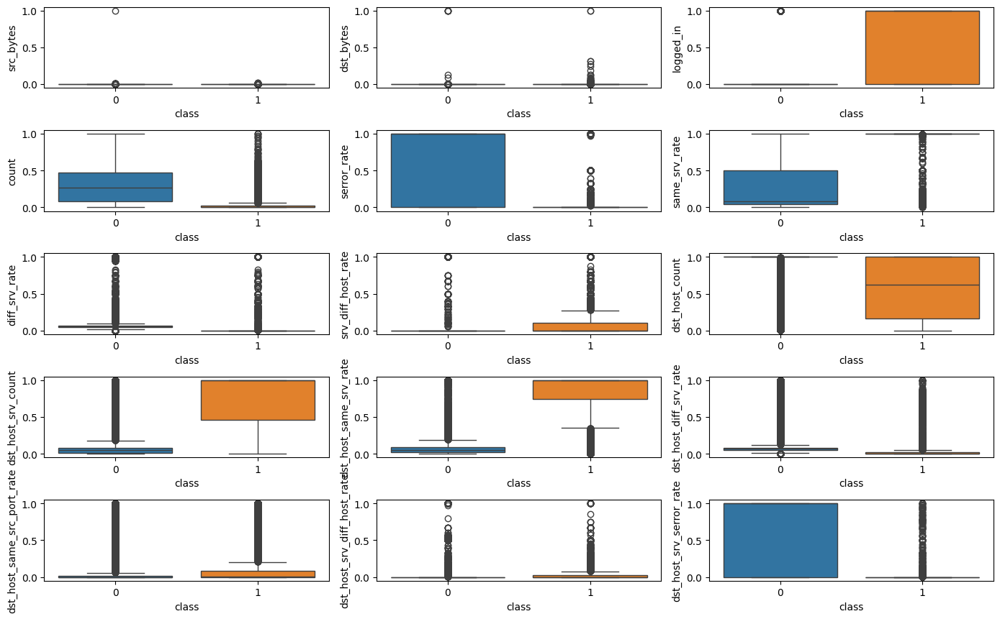

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns

# Manually calculate minimum and maximum values for each feature
min_vals = nids_original_dataframe[significant_features].drop('class', axis=1).min()
max_vals = nids_original_dataframe[significant_features].drop('class', axis=1).max()

# Perform Min-Max normalization
scaled_data = (nids_original_dataframe[significant_features].drop('class', axis=1) - min_vals) / (max_vals - min_vals)

plt.figure(figsize=(14, 10))

num_cols = 3
num_rows = int(scaled_data.shape[1] / num_cols) + 1

for index, col in enumerate(nids_original_dataframe[significant_features].drop('class', axis=1).columns):
    plt.subplot(num_rows, num_cols, index + 1)
    sns.boxplot(data=scaled_data, x=nids_original_dataframe['class'], y=col, hue=nids_original_dataframe['class'],legend=False)

    # Increase x-axis and y-axis title font size
    plt.xlabel('class', fontsize=10)
    plt.ylabel(col, fontsize=10)

plt.tight_layout()
plt.show()

In [41]:
print(nids_original_dataframe['class'])

0        1
1        1
2        0
3        1
4        1
        ..
25174    0
25175    0
25176    0
25177    0
25178    0
Name: class, Length: 25179, dtype: int64


In [42]:
print(nids_original_dataframe.head())

  protocol_type   service flag  src_bytes  dst_bytes  logged_in  count  \
0           tcp  ftp_data   SF        491          0          0      2   
1           udp     other   SF        146          0          0     13   
2           tcp   private   S0          0          0          0    123   
3           tcp      http   SF        232       8153          1      5   
4           tcp      http   SF        199        420          1     30   

   serror_rate  same_srv_rate  diff_srv_rate  srv_diff_host_rate  \
0          0.0           1.00           0.00                0.00   
1          0.0           0.08           0.15                0.00   
2          1.0           0.05           0.07                0.00   
3          0.2           1.00           0.00                0.00   
4          0.0           1.00           0.00                0.09   

   dst_host_count  dst_host_srv_count  dst_host_same_srv_rate  \
0             150                  25                    0.17   
1             25

In [43]:
print(nids_original_dataframe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25179 entries, 0 to 25178
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   protocol_type                25179 non-null  object 
 1   service                      25179 non-null  object 
 2   flag                         25179 non-null  object 
 3   src_bytes                    25179 non-null  int64  
 4   dst_bytes                    25179 non-null  int64  
 5   logged_in                    25179 non-null  int64  
 6   count                        25179 non-null  int64  
 7   serror_rate                  25179 non-null  float64
 8   same_srv_rate                25179 non-null  float64
 9   diff_srv_rate                25179 non-null  float64
 10  srv_diff_host_rate           25179 non-null  float64
 11  dst_host_count               25179 non-null  int64  
 12  dst_host_srv_count           25179 non-null  int64  
 13  dst_host_same_sr

In [44]:
# # Perform one-hot encoding for nominal categorical columns
categorical_columns = nids_original_dataframe.select_dtypes(exclude=['number']).columns.tolist()
print(categorical_columns)

print("Initialing Label Encoding")
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
    
    # Apply LabelEncoder to each column with categorical values
for column in nids_original_dataframe.columns:
    if nids_original_dataframe[column].dtype == 'object':  # Check if the column contains categorical values
        nids_original_dataframe[column] = label_encoder.fit_transform(nids_original_dataframe[column])
print("Label Encoding Completed")


['protocol_type', 'service', 'flag']
Initialing Label Encoding
Label Encoding Completed


In [45]:
print(nids_original_dataframe.shape)

(25179, 19)


**re-indexing of target column which changed during transformation**

In [46]:


column_name = 'class'
column_index = nids_original_dataframe.columns.get_loc(column_name)
# Moved 'class' column moved to the last position
new_column_order = list(nids_original_dataframe.columns[:column_index]) + list(nids_original_dataframe.columns[column_index+1:]) + [column_name]

# Reindex the DataFrame with the new column order
nids_original_dataframe = nids_original_dataframe.reindex(columns=new_column_order)



In [47]:
print(nids_original_dataframe.head())

   protocol_type  service  flag  src_bytes  dst_bytes  logged_in  count  \
0              1       19     9        491          0          0      2   
1              2       40     9        146          0          0     13   
2              1       44     5          0          0          0    123   
3              1       22     9        232       8153          1      5   
4              1       22     9        199        420          1     30   

   serror_rate  same_srv_rate  diff_srv_rate  srv_diff_host_rate  \
0          0.0           1.00           0.00                0.00   
1          0.0           0.08           0.15                0.00   
2          1.0           0.05           0.07                0.00   
3          0.2           1.00           0.00                0.00   
4          0.0           1.00           0.00                0.09   

   dst_host_count  dst_host_srv_count  dst_host_same_srv_rate  \
0             150                  25                    0.17   
1         

In [48]:
nids_original_dataframe.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25179 entries, 0 to 25178
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   protocol_type                25179 non-null  int64  
 1   service                      25179 non-null  int64  
 2   flag                         25179 non-null  int64  
 3   src_bytes                    25179 non-null  int64  
 4   dst_bytes                    25179 non-null  int64  
 5   logged_in                    25179 non-null  int64  
 6   count                        25179 non-null  int64  
 7   serror_rate                  25179 non-null  float64
 8   same_srv_rate                25179 non-null  float64
 9   diff_srv_rate                25179 non-null  float64
 10  srv_diff_host_rate           25179 non-null  float64
 11  dst_host_count               25179 non-null  int64  
 12  dst_host_srv_count           25179 non-null  int64  
 13  dst_host_same_sr

In [49]:
print(nids_original_dataframe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25179 entries, 0 to 25178
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   protocol_type                25179 non-null  int64  
 1   service                      25179 non-null  int64  
 2   flag                         25179 non-null  int64  
 3   src_bytes                    25179 non-null  int64  
 4   dst_bytes                    25179 non-null  int64  
 5   logged_in                    25179 non-null  int64  
 6   count                        25179 non-null  int64  
 7   serror_rate                  25179 non-null  float64
 8   same_srv_rate                25179 non-null  float64
 9   diff_srv_rate                25179 non-null  float64
 10  srv_diff_host_rate           25179 non-null  float64
 11  dst_host_count               25179 non-null  int64  
 12  dst_host_srv_count           25179 non-null  int64  
 13  dst_host_same_sr

In [50]:


categorical_columns = nids_original_dataframe.select_dtypes(exclude=['number']).columns.tolist()
print(categorical_columns)

catego_df = pd.DataFrame()
for col in categorical_columns:
    catego_df[col] = nids_original_dataframe[col]

print(catego_df)

[]
Empty DataFrame
Columns: []
Index: []


In [51]:
dataset_target = nids_original_dataframe['class'].values
dataset_features = nids_original_dataframe.drop(['class'], axis=1)



In [52]:
print(nids_original_dataframe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25179 entries, 0 to 25178
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   protocol_type                25179 non-null  int64  
 1   service                      25179 non-null  int64  
 2   flag                         25179 non-null  int64  
 3   src_bytes                    25179 non-null  int64  
 4   dst_bytes                    25179 non-null  int64  
 5   logged_in                    25179 non-null  int64  
 6   count                        25179 non-null  int64  
 7   serror_rate                  25179 non-null  float64
 8   same_srv_rate                25179 non-null  float64
 9   diff_srv_rate                25179 non-null  float64
 10  srv_diff_host_rate           25179 non-null  float64
 11  dst_host_count               25179 non-null  int64  
 12  dst_host_srv_count           25179 non-null  int64  
 13  dst_host_same_sr

#### **Performing Principal Component Analysis**

**Performing Standardization before PCA**

In [53]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
dataset_features_standardized = scaler.fit_transform(dataset_features)

In [54]:
from sklearn.decomposition import PCA
pca = PCA(random_state=42)
pca.fit_transform(dataset_features_standardized)

array([[-0.53558693,  0.23340069,  0.25544411, ...,  0.142248  ,
         0.16649173,  0.03141418],
       [ 1.32195346,  1.47603021,  3.4978114 , ...,  1.37956989,
        -0.19249495,  0.02788029],
       [ 3.17533665, -0.35719608, -0.94019905, ...,  0.15743904,
        -0.05841544, -0.01109207],
       ...,
       [ 2.2289832 ,  0.26280379,  0.69651652, ...,  0.38030293,
        -0.08009977,  0.01000164],
       [ 3.06113164, -0.36074304, -0.99617535, ...,  0.01195117,
        -0.0192828 , -0.01344304],
       [ 2.36462214, -0.4892858 , -1.15228366, ..., -0.01811998,
        -0.00805414, -0.02528914]])

In [55]:
pca.n_components_

18

In [56]:
pca.explained_variance_ratio_

array([0.34154672, 0.11877018, 0.09678417, 0.06077971, 0.05605131,
       0.05538129, 0.05052563, 0.04034787, 0.03557632, 0.03323832,
       0.02616412, 0.02444335, 0.02324296, 0.01834584, 0.00987816,
       0.00476009, 0.00307294, 0.00109103])

In [57]:
pca.get_covariance()

array([[ 1.00003972e+00,  2.89101497e-02,  9.57203035e-02,
        -1.29604375e-03, -4.77492231e-03, -1.02671785e-01,
        -6.35994901e-02, -7.86342638e-02,  4.72910110e-02,
         2.33084141e-02, -2.34704158e-01,  2.37842101e-01,
         1.03614418e-01,  4.36315583e-03,  1.31641032e-01,
        -2.05989160e-01, -3.61175724e-01, -7.97424328e-02],
       [ 2.89101497e-02,  1.00003972e+00, -2.92875881e-01,
         8.55683754e-03, -1.34296928e-02, -1.27482993e-01,
         8.06594297e-02,  2.66392542e-01, -3.51109909e-01,
         2.04110403e-01, -9.53306827e-02,  1.80398842e-01,
        -4.00748665e-01, -4.43324157e-01,  2.85792472e-01,
        -9.99220497e-02, -1.54795861e-01,  2.67586994e-01],
       [ 9.57203035e-02, -2.92875881e-01,  1.00003972e+00,
        -6.59697948e-03,  2.76237359e-02,  5.88356047e-01,
        -4.73465967e-01, -4.57163554e-01,  7.19894866e-01,
        -2.88785655e-01,  2.16956752e-01, -3.19222117e-01,
         5.84641189e-01,  6.34900896e-01, -2.84080575e

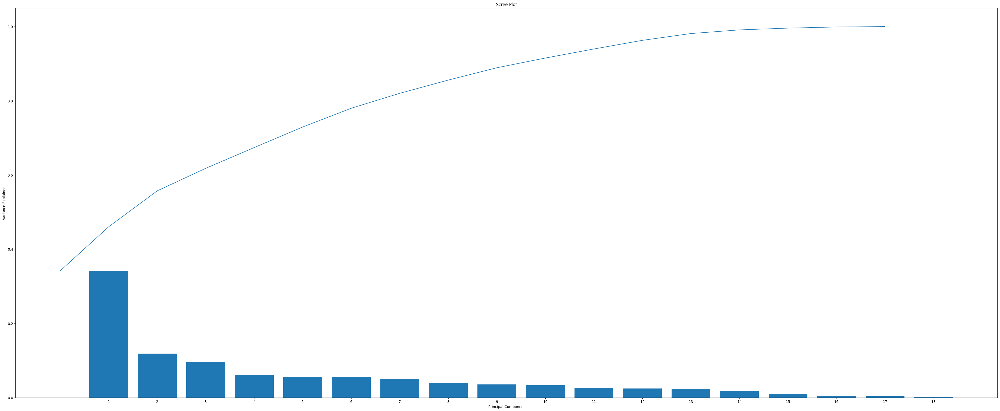

In [58]:
# Scree plot: Cumulative Explained Variance
fig, ax = plt.subplots(figsize=(50, 20))
plt.bar(range(1, pca.n_components_+1), pca.explained_variance_ratio_)
plt.xticks(range(1, pca.n_components_+1))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [59]:
# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
print("Cumulative Variance:",cumulative_variance)

# Choose the number of components that capture a specified percentage of variance
target_variance = 0.80
num_components = np.argmax(cumulative_variance >= target_variance) + 1

print(f'The number of components to capture {target_variance * 100}% variance: {num_components}')



Cumulative Variance: [0.34154672 0.4603169  0.55710107 0.61788077 0.67393208 0.72931338
 0.779839   0.82018688 0.8557632  0.88900152 0.91516564 0.93960898
 0.96285195 0.98119779 0.99107594 0.99583604 0.99890897 1.        ]
The number of components to capture 80.0% variance: 8


In [60]:
# Use the selected number of components for further analysis or dimensionality reduction
final_pca = PCA(n_components=num_components,random_state=42)
nids_original_dataframe_pca = final_pca.fit_transform(dataset_features_standardized)

In [61]:
components = final_pca.components_.T

reduced_df_pca_columns = ['PC'+str(item) for item in range(0,num_components)]
nids_reduced_df = pd.DataFrame(nids_original_dataframe_pca, columns=reduced_df_pca_columns)
print(nids_reduced_df.head())


        PC0       PC1       PC2       PC3       PC4       PC5       PC6  \
0 -0.535587  0.233401  0.255444 -0.444033  0.210730  0.010618 -0.701877   
1  1.321953  1.476030  3.497811 -0.492773  0.385718 -0.101850 -2.394794   
2  3.175337 -0.357196 -0.940199  0.719855  0.032053 -0.079586 -0.448517   
3 -2.589136 -0.683346 -0.364482  0.525334 -0.020082 -0.064686  0.414394   
4 -2.115402 -1.392528  0.106239  0.037310 -0.174071  0.039753  0.542829   

        PC7  
0 -0.545621  
1 -0.071446  
2  0.049863  
3 -0.617223  
4 -0.039346  


**Data variabilty captured in each features**

<Figure size 1000x800 with 0 Axes>

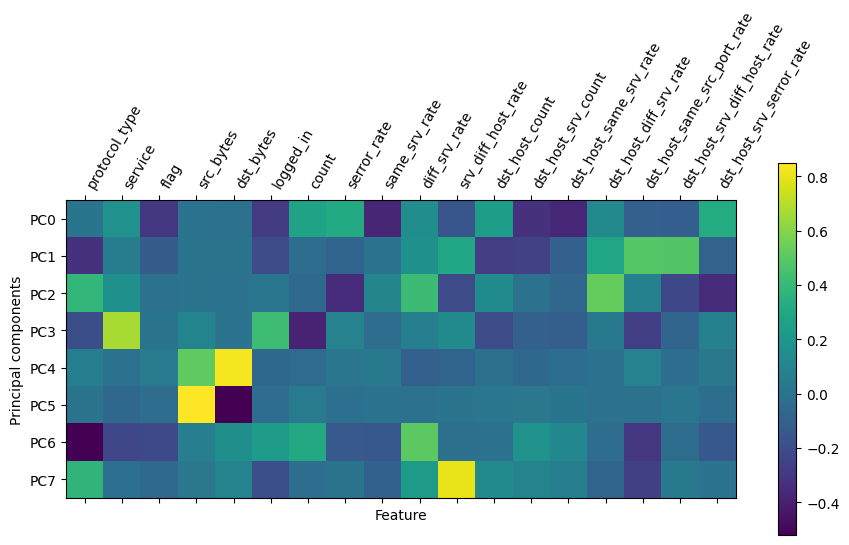

In [62]:
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
list_indx = [i for i in range(0,len(reduced_df_pca_columns))]

plt.matshow(final_pca.components_, cmap='viridis')
plt.yticks( list_indx, reduced_df_pca_columns)
plt.colorbar()
plt.xticks(range(len(nids_original_dataframe.drop('class',axis=1).columns.tolist())), nids_original_dataframe.drop('class',axis=1).columns.tolist(), rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components")

plt.show()


In [63]:
print(nids_reduced_df.shape)

(25179, 8)


In [64]:
nids_reduced_df['class'] = dataset_target

merged_df = nids_reduced_df.copy()

In [65]:
y = merged_df['class'].values
X = merged_df.drop(['class'], axis=1)

**Splitting the dataset into training and testing datasets**

In [66]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, shuffle=True, random_state=42)  

In [67]:
print(X_train.values)

[[-1.37226435  1.06296945 -0.57338851 ...  0.16425237  0.46765009
  -0.13315727]
 [ 3.73118577 -0.3142493  -0.82936168 ... -0.07918343 -0.31644275
  -0.03182359]
 [-2.7475668  -0.61159051 -0.21497123 ... -0.03252718  0.45857043
  -0.6153559 ]
 ...
 [ 0.27709315  0.79981423  2.74007422 ... -0.08068903 -2.96583606
  -0.24121199]
 [ 2.12080907  0.08110941  0.21778652 ...  0.22559481  1.23916016
   0.07438238]
 [ 3.11650325 -0.31651833 -0.91458181 ... -0.10127227 -0.60141323
   0.05027858]]


### **Logistic Regression**

In [68]:

from sklearn.linear_model import LogisticRegression
# Create the logistic regression model
logre = LogisticRegression(solver='liblinear')


**10 Fold Cross Validaton for Logistic Regression**

In [69]:
from sklearn.model_selection import cross_val_score
# Perform 10-fold cross-validation
cv_scores = cross_val_score(logre, X_train, y_train, cv=5, scoring='accuracy')
# Print the cross-validation scores
print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())
# Fit the model on the entire dataset


Cross-validation scores: [0.94156028 0.94836879 0.94439716 0.93531915 0.93673759]
Mean cross-validation score: 0.9412765957446808


In [70]:
logre.fit(X_train,y_train)

LogisticRegression(solver='liblinear')

In [71]:
# Predict the class for the test data (using the entire dataset)
y_pred = logre.predict(X_test)

In [72]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,y_pred))

0.9450622186920836


In [73]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.95      0.93      0.94      3521
           1       0.94      0.96      0.95      4033

    accuracy                           0.95      7554
   macro avg       0.95      0.94      0.94      7554
weighted avg       0.95      0.95      0.95      7554



In [74]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test,y_pred)

0.9441145975973707

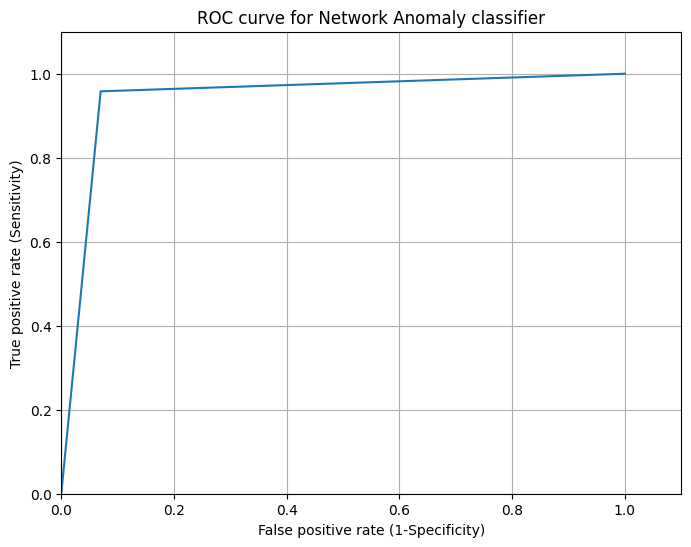

In [75]:
from sklearn.metrics import roc_curve
plt.figure(figsize=(8,6))

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr,tpr)
plt.xlim([0.0, 1.1])
plt.ylim([0.0, 1.1])
plt.title('ROC curve for Network Anomaly classifier')
plt.xlabel('False positive rate (1-Specificity)')
plt.ylabel('True positive rate (Sensitivity)')
plt.grid(True)

### **RandomForest Classifier**

In [76]:
from sklearn.ensemble import RandomForestClassifier
# Define the Random Forest Classifier parameters
clf_rf = RandomForestClassifier(criterion='gini', max_features='sqrt', max_leaf_nodes=10)

# Perform cross-validation
scores = cross_val_score(clf_rf, X_train, y_train, cv=5)  # 5-fold cross-validation
mean_accuracy = scores.mean()  # Calculate mean accuracy across all folds

print("Mean Accuracy:", mean_accuracy)
clf_rf.fit(X_train, y_train)

Mean Accuracy: 0.9547801418439716


RandomForestClassifier(max_leaf_nodes=10)

In [77]:
y_pred = clf_rf.predict(X_test)

In [78]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_pred, y_test))

0.9606830818109611


In [79]:
print(nids_original_dataframe['class'].value_counts())

class
1    13442
0    11737
Name: count, dtype: int64


In [80]:

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.97      0.94      0.96      3521
           1       0.95      0.97      0.96      4033

    accuracy                           0.96      7554
   macro avg       0.96      0.96      0.96      7554
weighted avg       0.96      0.96      0.96      7554



### **Support Vector Machine (SVM)**

In [81]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
import numpy as np

list_of_kernels = ['linear', 'sigmoid']

kernel_accuracy = {}
for kernel in list_of_kernels:
    svm_classifier = SVC(kernel=kernel)
    # Perform cross-validation
    scores = cross_val_score(svm_classifier, X_train, y_train, cv=5)  # 5-fold cross-validation
    accuracy = scores.mean()  # Calculate mean accuracy across all folds
    kernel_accuracy[kernel] = accuracy

print(kernel_accuracy)


{'linear': 0.9413333333333334, 'sigmoid': 0.8306382978723403}


In [82]:
svm_classifier = SVC(kernel='linear')
svm_classifier.fit(X_train, y_train)

# Predict the response for test dataset
y_pred = svm_classifier.predict(X_test)

# Model accuracy
accuracy = accuracy_score(y_test, y_pred)

print('Accuracy:', accuracy)


Accuracy: 0.9451945988880064


In [83]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      0.93      0.94      3521
           1       0.94      0.96      0.95      4033

    accuracy                           0.95      7554
   macro avg       0.95      0.94      0.94      7554
weighted avg       0.95      0.95      0.95      7554



### **Gaussian Naive Bayes** 

In [84]:
from sklearn.naive_bayes import GaussianNB
# GAUSSIAN NAIVE BAYES
params = {'var_smoothing': 1e-9}  
gnb = GaussianNB(**params)
# Perform cross-validation
scores = cross_val_score(gnb, X_train, y_train, cv=5)  # 5-fold cross-validation
mean_accuracy = scores.mean() 
print(mean_accuracy) # Calculate mean accuracy across all folds

0.9189787234042553


In [85]:
# Train the model using the training sets
gnb.fit(X_train, y_train)

# Predict the response for test dataset
y_pred = gnb.predict(X_test)

# Model accuracy
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

Accuracy: 0.9242785279322213


In [86]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.90      0.92      3521
           1       0.92      0.94      0.93      4033

    accuracy                           0.92      7554
   macro avg       0.93      0.92      0.92      7554
weighted avg       0.92      0.92      0.92      7554



### **Multi-Layer Perceptron**

In [87]:
# Splitting the dataset into training and testing datasets
y = merged_df['class'].values
X = merged_df.drop(['class'], axis=1)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, shuffle=True, random_state=42)  

**Hyper-parameter tuning**

In [88]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler

# Define parameter distribution
param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': np.logspace(-4, 0, 5),
}

# Perform Randomized Search
random_search = RandomizedSearchCV(MLPClassifier(max_iter=1000, random_state=42, early_stopping=True), param_dist, cv=10, n_iter=5)
random_search.fit(X_train, y_train)

# Best parameters
print("Best Parameters:", random_search.best_params_)

# Evaluate model with best parameters
best_model = random_search.best_estimator_
print(best_model)
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Best Model Accuracy:", accuracy)

Best Parameters: {'solver': 'adam', 'hidden_layer_sizes': (50, 50), 'alpha': 0.001, 'activation': 'relu'}
MLPClassifier(alpha=0.001, early_stopping=True, hidden_layer_sizes=(50, 50),
              max_iter=1000, random_state=42)
Best Model Accuracy: 0.9765687053216838


In [89]:
from sklearn.neural_network import MLPClassifier

# Create MLP Classifier
mlp_classifier = MLPClassifier(hidden_layer_sizes=(50,100) ,
                               activation=random_search.best_params_['activation'],
                               solver=random_search.best_params_['solver'],
                               max_iter=500,
                               alpha=0.001,
                               early_stopping=True,
                               random_state=42)

mlp_classifier.fit(X_train, y_train)

MLPClassifier(activation='tanh', alpha=0.001, early_stopping=True,
              hidden_layer_sizes=(50, 100), max_iter=500, random_state=42)

In [90]:
from sklearn.metrics import accuracy_score

# Predictions
y_pred = mlp_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9809372517871326


In [91]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      3521
           1       0.98      0.99      0.98      4033

    accuracy                           0.98      7554
   macro avg       0.98      0.98      0.98      7554
weighted avg       0.98      0.98      0.98      7554



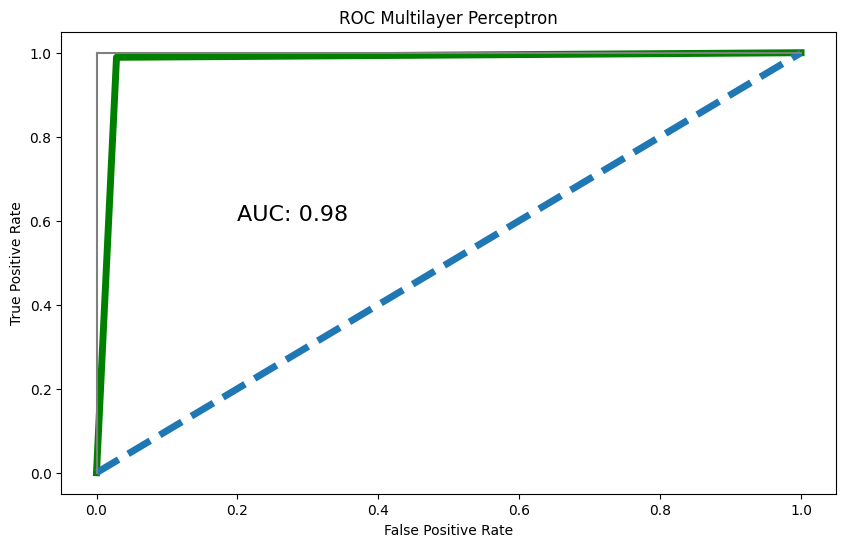

In [92]:
# ROC Curve
from sklearn.metrics import roc_auc_score,roc_curve
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test,y_pred)
plt.figure(figsize=(10,6))
plt.title('ROC Multilayer Perceptron')
plt.plot(false_positive_rate, true_positive_rate, linewidth=5, color='green')
plt.plot([0,1],ls='--',linewidth=5)
plt.plot([0,0],[1,0],c='.5')
plt.plot([1,1],c='.5')
plt.text(0.2,0.6,'AUC: {:.2f}'.format(roc_auc_score(y_test,y_pred)),size= 16)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

#### **Classification Report of all the models**

In [94]:

models = {"Logistic Reg":logre,"Random Forest":clf_rf, "SVM":svm_classifier, "Naive-Bayes":gnb, "Multi-Layer Percp":mlp_classifier}
accuracy = accuracy_score(y_test, y_pred)


from sklearn.metrics import confusion_matrix, classification_report, f1_score
def line(model_name,sym="*"):
    return sym*(25-len(model_name)//2)
target_names=["anomaly","normal"]
for model_name, model in models.items():
    print(model_name, model)
    print(line(model_name), model_name, 'Model Testing', line(model_name))
    print(confusion_matrix(y_test,model.predict(X_test) ))
    print(line(model_name,'-'))
    print(classification_report(y_test,model.predict(X_test) , target_names=target_names))
    print(line(model_name, '-'))

Logistic Reg LogisticRegression(solver='liblinear')
******************* Logistic Reg Model Testing *******************
[[3275  246]
 [ 169 3864]]
-------------------
              precision    recall  f1-score   support

     anomaly       0.95      0.93      0.94      3521
      normal       0.94      0.96      0.95      4033

    accuracy                           0.95      7554
   macro avg       0.95      0.94      0.94      7554
weighted avg       0.95      0.95      0.95      7554

-------------------
Random Forest RandomForestClassifier(max_leaf_nodes=10)
******************* Random Forest Model Testing *******************
[[3326  195]
 [ 102 3931]]
-------------------
              precision    recall  f1-score   support

     anomaly       0.97      0.94      0.96      3521
      normal       0.95      0.97      0.96      4033

    accuracy                           0.96      7554
   macro avg       0.96      0.96      0.96      7554
weighted avg       0.96      0.96      0.96 

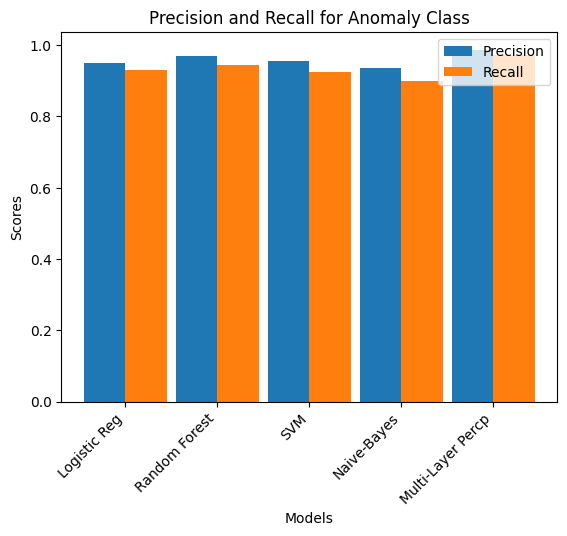

In [95]:
import matplotlib.pyplot as plt
import numpy as np

# Define models and their names
models = {"Logistic Reg": logre, "Random Forest": clf_rf, "SVM": svm_classifier, "Naive-Bayes": gnb, "Multi-Layer Percp": mlp_classifier}
model_names = list(models.keys())

# Initialize lists to store precision and recall scores
precision_scores = []
recall_scores = []

# Calculate precision and recall scores for each model
for model_name, model in models.items():
    report = classification_report(y_test, model.predict(X_test), target_names=target_names, output_dict=True)
    precision_scores.append(report["anomaly"]["precision"])
    recall_scores.append(report["anomaly"]["recall"])

# Plot bar chart
x = np.arange(len(model_names))
width = 0.45

fig, ax = plt.subplots()
bars1 = ax.bar(x - width/2, precision_scores, width, label='Precision')
bars2 = ax.bar(x + width/2, recall_scores, width, label='Recall')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Precision and Recall for Anomaly Class')
ax.set_xticks(x)
ax.set_xticklabels(model_names, rotation=45, ha='right')
ax.legend()

plt.show()


#### **Confusion Matrix for the Models**

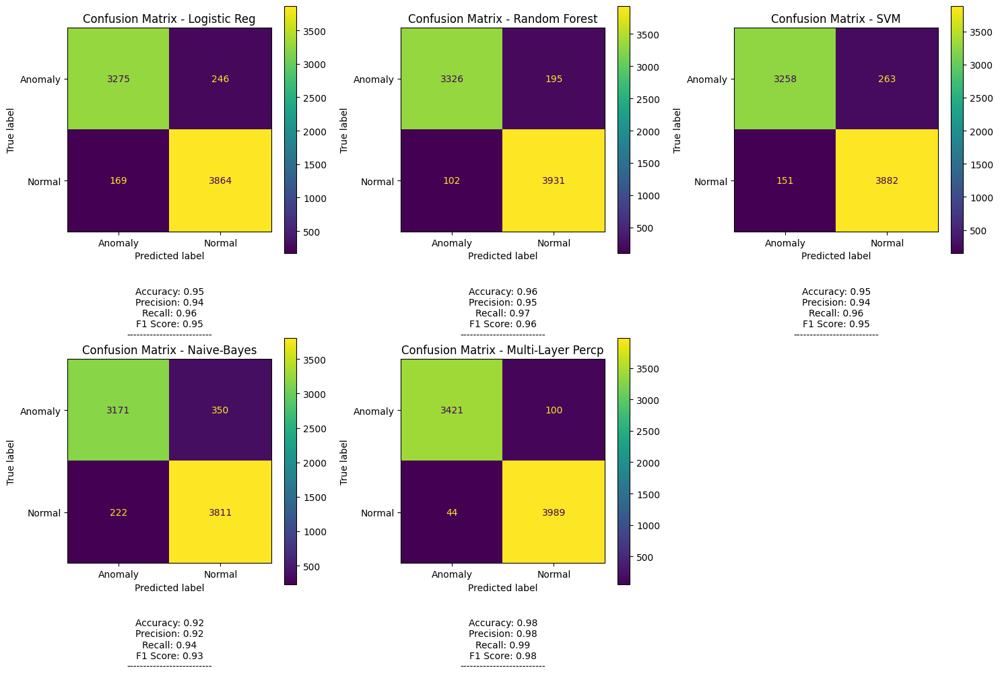

In [96]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score

# Calculate the number of rows and columns for the grid layout
num_models = len(models)
num_cols = 3  # Number of columns in the grid
num_rows = (num_models + num_cols - 1) // num_cols  # Round up the number of rows

# Create the grid layout
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

# Flatten the axes if necessary
if num_rows == 1:
    axes = [axes]

# Iterate over the models and plot each confusion matrix
for i, (model_name, model) in enumerate(models.items()):
    row_idx = i // num_cols
    col_idx = i % num_cols
    
    # Calculate the confusion matrix
    conf_matrix = confusion_matrix(y_test, model.predict(X_test))
    
    # Display the confusion matrix using ConfusionMatrixDisplay
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Anomaly', 'Normal'])
    disp.plot(ax=axes[row_idx][col_idx], cmap='viridis')
    axes[row_idx][col_idx].set_title(f'Confusion Matrix - {model_name}')
    
    # Add a small space after the confusion matrix
    axes[row_idx][col_idx].text(0, -0.1, '\n', horizontalalignment='center', verticalalignment='center', transform=axes[row_idx][col_idx].transAxes)
    
    # Calculate accuracy, precision, recall, and F1 score
    acc = accuracy_score(y_test, model.predict(X_test))
    precision = precision_score(y_test, model.predict(X_test))
    recall = recall_score(y_test, model.predict(X_test))
    f1 = f1_score(y_test, model.predict(X_test))
    
    # Display accuracy, precision, recall, and F1 score as text below the confusion matrix
       # Display accuracy, precision, recall, and F1 score as text below the confusion matrix
    axes[row_idx][col_idx].text(0.5, -0.4, f'Accuracy: {acc:.2f}\nPrecision: {precision:.2f}\nRecall: {recall:.2f}\nF1 Score: {f1:.2f}\n--------------------------',
                                 horizontalalignment='center', verticalalignment='center', transform=axes[row_idx][col_idx].transAxes)

    


# Remove any extra blank subplots
if num_models < num_rows * num_cols:
    for i in range(num_models, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

# Adjust layout and display the plot
plt.tight_layout()
plt.show()
